In [84]:
# Python 3.8
# keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, ZeroPadding2D,Reshape, Dense, Dropout, Activation, Flatten
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Sequential
import tensorflow as tf
import keras

# sklearn
from sklearn.svm import SVC

# Tool
import matplotlib.pyplot as plt
import numpy as np

# 1. Data Loading

In [141]:
classes = ['taffy','dongbro','kaguranana']

In [145]:
train_data = []
train_labels = []
for i in range(21):
    data = np.array(tf.keras.utils.load_img('train/taffy/'+ str(i) + '.png')) / 255
    data = tf.image.resize(data, [255, 255])
    data = np.array(data)
    train_data.append(data)
    train_labels.append(0)
for i in range(21):
    data = np.array(tf.keras.utils.load_img('train/dongbro/'+ str(i) + '.png')) / 255
    data = tf.image.resize(data, [255, 255])
    data = np.array(data)
    train_data.append(data)
    train_labels.append(1)
for i in range(21):
    data = np.array(tf.keras.utils.load_img('train/kaguranana/'+ str(i) + '.png')) / 255
    data = tf.image.resize(data, [255, 255])
    data = np.array(data)
    train_data.append(data)
    train_labels.append(2)
    

is_one_hot = True

train_X = np.stack(train_data, axis=0)
train_labels = np.stack(train_labels, axis=0)
if is_one_hot:
    train_y = np.zeros((train_labels.shape[0],len(classes)))
    for i in range(train_y.shape[0]):
        train_y[i][train_labels[i]] = train_y[i][train_labels[i]] + 1
else:
    train_y = train_labels

# 2. Data previewing

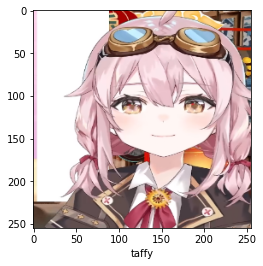

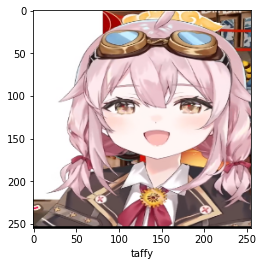

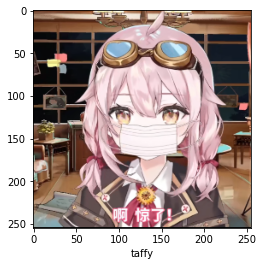

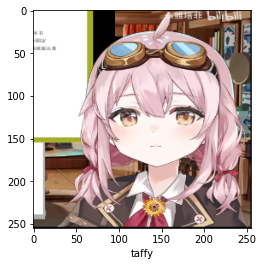

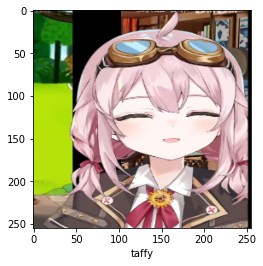

...

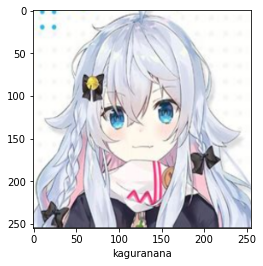

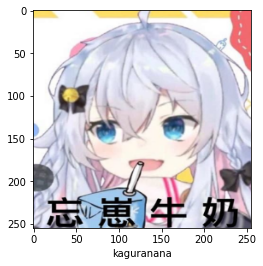

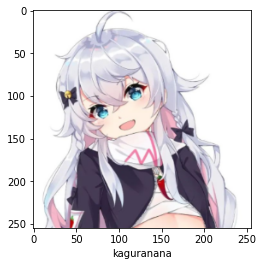

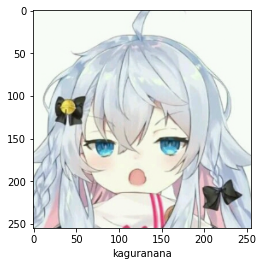

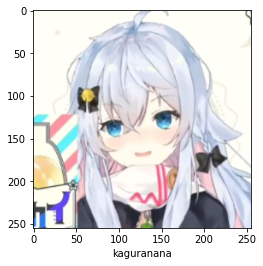

In [147]:
for i in range(train_X.shape[0]):
    plt.imshow(train_X[i])
    plt.xlabel(classes[train_labels[i]])
    plt.show()

# 3. Model compile and training

In [148]:
# model
model = Sequential()
#
model.add(Conv2D(16, (3, 3), name='conv1', padding='same', activation='relu', kernel_initializer='glorot_uniform', input_shape=(255,255,3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=None, padding='same', data_format=None))
#
model.add(Conv2D(32, (3, 3), name='conv2', padding='same', activation='relu', kernel_initializer='glorot_uniform', input_shape=(255,255,3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=None, padding='same', data_format=None))
#
model.add(Conv2D(64, (3, 3), name='conv3', padding='same', activation='relu', kernel_initializer='glorot_uniform', input_shape=(255,255,3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=None, padding='same', data_format=None))
#
model.add(Flatten())
#
model.add(Dense(512, name='dense1', kernel_initializer='he_normal', activation='relu'))
# only binary
model.add(Dense(3, name='dense2', kernel_initializer='he_normal', activation='softmax'))

In [149]:
model.compile(
    loss = 'categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

In [150]:
history = model.fit(
    train_X, 
    train_y,
    epochs = 50,
    verbose= 2,
    validation_split=0.2
)

Epoch 1/50
2/2 - 2s - loss: 2.4463 - accuracy: 0.4800 - val_loss: 41.7408 - val_accuracy: 0.0000e+00 - 2s/epoch - 958ms/step
Epoch 2/50
2/2 - 1s - loss: 14.1444 - accuracy: 0.4200 - val_loss: 4.9263 - val_accuracy: 0.0000e+00 - 1s/epoch - 664ms/step
Epoch 3/50
2/2 - 1s - loss: 1.9218 - accuracy: 0.3200 - val_loss: 1.7818 - val_accuracy: 0.0000e+00 - 1s/epoch - 618ms/step
Epoch 4/50
2/2 - 1s - loss: 1.5130 - accuracy: 0.4200 - val_loss: 0.6684 - val_accuracy: 0.8462 - 1s/epoch - 658ms/step
Epoch 5/50
2/2 - 1s - loss: 0.5389 - accuracy: 0.7200 - val_loss: 1.4691 - val_accuracy: 0.0000e+00 - 1s/epoch - 615ms/step
Epoch 6/50
2/2 - 1s - loss: 0.1980 - accuracy: 0.8400 - val_loss: 1.3373 - val_accuracy: 0.0000e+00 - 1s/epoch - 613ms/step
Epoch 7/50
2/2 - 1s - loss: 0.0823 - accuracy: 0.9800 - val_loss: 0.2427 - val_accuracy: 0.9231 - 1s/epoch - 615ms/step
Epoch 8/50
2/2 - 1s - loss: 0.0353 - accuracy: 1.0000 - val_loss: 0.0901 - val_accuracy: 1.0000 - 1s/epoch - 620ms/step
Epoch 9/50
2/2 - 1

# 4. Loading test data set

In [151]:
test_data = []
test_labels = []
for i in range(5):
    data = np.array(tf.keras.utils.load_img('test/taffy/'+ str(i) + '.png')) / 255
    data = tf.image.resize(data, [255, 255])
    data = np.array(data)
    test_data.append(data)
    test_labels.append(0)
for i in range(5):
    data = np.array(tf.keras.utils.load_img('test/dongbro/'+ str(i) + '.png')) / 255
    data = tf.image.resize(data, [255, 255])
    data = np.array(data)
    test_data.append(data)
    test_labels.append(1)
for i in range(5):
    data = np.array(tf.keras.utils.load_img('test/kaguranana/'+ str(i) + '.png')) / 255
    data = tf.image.resize(data, [255, 255])
    data = np.array(data)
    test_data.append(data)
    test_labels.append(2)
    
test_X = np.stack(test_data, axis=0)
test_labels = np.stack(test_labels, axis=0)
if is_one_hot:
    test_y = np.zeros((test_labels.shape[0],len(classes)))
    for i in range(test_y.shape[0]):
        test_y[i][test_labels[i]] = test_y[i][test_labels[i]] + 1
else:
    test_y = test_labels

In [152]:
print(test_X.shape)
print(test_y.shape)

(15, 255, 255, 3)
(15, 3)


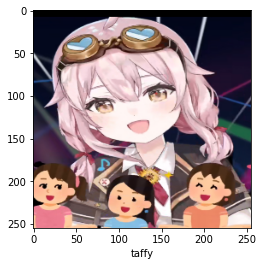

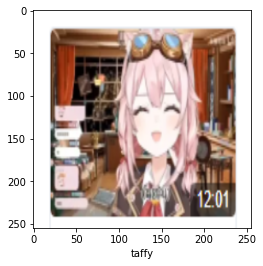

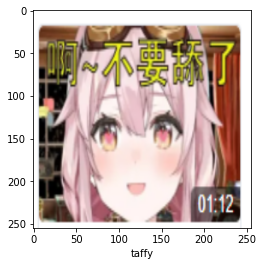

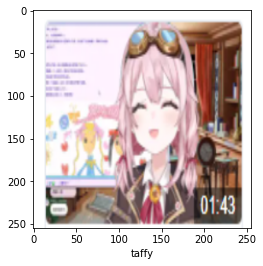

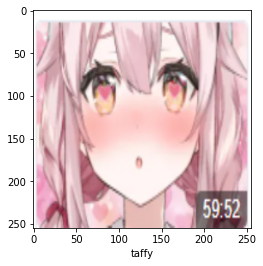

...

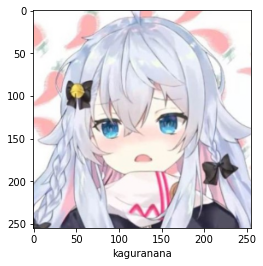

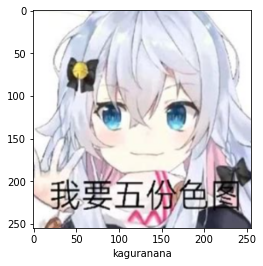

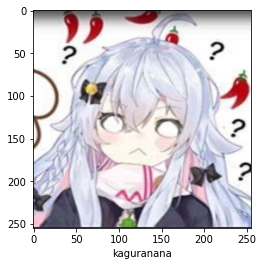

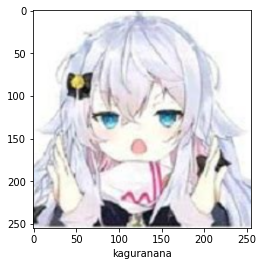

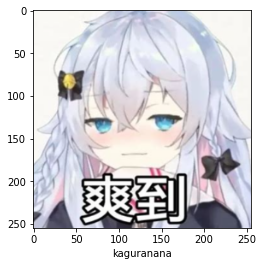

In [154]:
for i in range(15):
    plt.imshow(test_X[i])
    plt.xlabel(classes[test_labels[i]])
    plt.show()

# 5. Model performance

In [155]:
score = model.evaluate(test_X, test_y, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1/1 [==============================] - 0s 88ms/step - loss: 1.8906 - accuracy: 0.6667
Test loss: 1.8906196355819702
Test accuracy: 0.6666666865348816


In [156]:
def plot_confusion_matrix(cm, title='Confusion matrix', cmap=plt.cm.Blues, labels=[], scale=(1,1)):
    plt.figure(figsize=scale)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(labels))
    plt.xticks(tick_marks, labels, rotation=45)
    plt.yticks(tick_marks, labels)
    
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [157]:
# confusion matrix
conf = np.zeros([len(classes),len(classes)])
confnorm1 = np.zeros([len(classes),len(classes)])

test_pred_labels = model.predict(test_X, batch_size=2)

for i in range(0,test_X.shape[0]):
    j = list(test_y[i,:]).index(1)
    k = int(np.argmax(test_pred_labels[i,:]))
    conf[j,k] = conf[j,k] + 1
    
for i in range(0,len(classes)):
    confnorm1[i,:] = conf[i,:] / np.sum(conf[i,:])

print('Confusion matrix [number]:')
print(conf)

print('Accuracy for each class:')
for i in range(len(classes)):
    sum = 0
    for j in range(len(classes)):
        sum += conf[i][j]
    print('accuracy of class[%s] :%s' % (classes[i], confnorm1[i,i]))

Confusion matrix [number]:
[[4. 0. 1.]
 [0. 2. 3.]
 [1. 0. 4.]]
Accuracy for each class:
accuracy of class[taffy] :0.8
accuracy of class[dongbro] :0.4
accuracy of class[kaguranana] :0.8


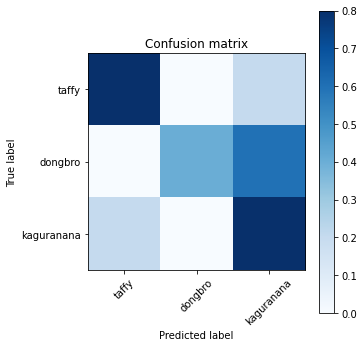

In [158]:
plot_confusion_matrix(confnorm1, labels=classes, scale=(5,5))

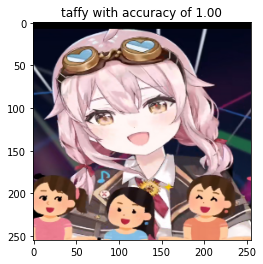

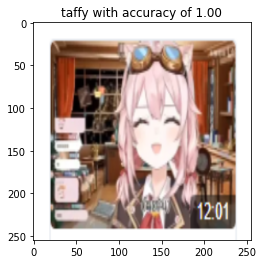

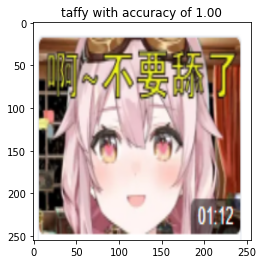

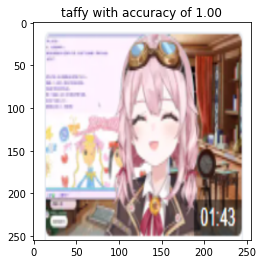

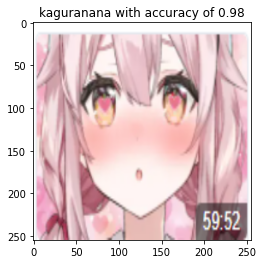

...

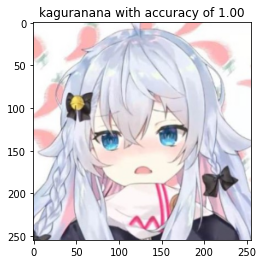

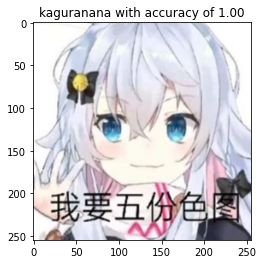

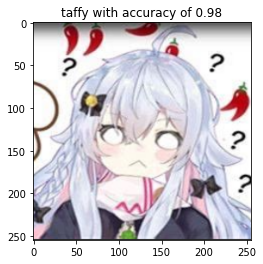

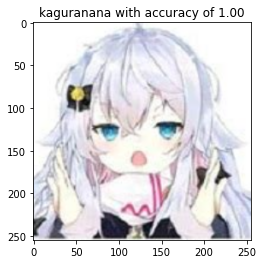

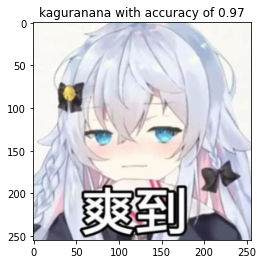

In [159]:
for i in range(15):
    plt.imshow(test_X[i])
    plt.title('%s with accuracy of %.2f' % (classes[np.argmax(test_pred_labels[i])], test_pred_labels[i].max()))
    plt.show()

In [160]:
model.predict(test_X, verbose=1)

1/1 [==============================] - 0s 88ms/step


array([[9.9962246e-01, 3.7089721e-04, 6.6670000e-06],
       [9.9999774e-01, 1.0245531e-09, 2.2726815e-06],
       [1.0000000e+00, 6.5785306e-16, 1.1928926e-13],
       [9.9891853e-01, 1.2964211e-06, 1.0801821e-03],
       [2.0941794e-02, 1.3049665e-05, 9.7904521e-01],
       [3.2726482e-05, 9.9996078e-01, 6.4196051e-06],
       [3.9105397e-04, 3.1004660e-05, 9.9957794e-01],
       [7.4449450e-02, 5.5898786e-01, 3.6656266e-01],
       [4.5410633e-02, 6.8515714e-04, 9.5390421e-01],
       [1.2905610e-01, 9.4591044e-02, 7.7635288e-01],
       [1.3286530e-04, 4.6350362e-04, 9.9940360e-01],
       [2.5736756e-05, 4.0836127e-05, 9.9993348e-01],
       [9.7775799e-01, 9.5236453e-04, 2.1289665e-02],
       [8.1554710e-05, 1.3820986e-04, 9.9978024e-01],
       [5.6080000e-05, 3.3676747e-02, 9.6626717e-01]], dtype=float32)

# 6. Adversarial attack

In [161]:
def generate_delta(baseImage):
    return tf.Variable(tf.zeros_like(baseImage), trainable=True)

def preprocess_data(base_image, delta):
    return base_image + delta

def clip_eps(tensor, eps):
    return tf.clip_by_value(tensor,clip_value_min=-eps, clip_value_max=eps)

## 6.1. Non-target

In [165]:
def generate_adversaries_non_target(model, baseImage, delta, classIdx, cceLoss, optimizer, steps=50):
    for step in range(steps):
        with tf.GradientTape() as tape:
            tape.watch(delta)
            
            adversary = preprocess_data(baseImage, delta)
            #prediction = model.predict(np.array([adversary]))
            #loss, acc = model.evaluate(np.array([adversary]), np.array([classIdx]))
            predictions = model(adversary, training=False)
            loss = -cceLoss(predictions, tf.convert_to_tensor([classIdx]))
            
        if step % 5 == 0:
            print("step:%d, loss:%.4f" % (step, loss))
                
        gradients = tape.gradient(loss, delta)
            
        optimizer.apply_gradients([(gradients, delta)])
        delta.assign_add(clip_eps(delta, eps=EPS))
            
    return delta

In [192]:
# define
#EPS = 2 / 255.0 / 255.0
EPS = 4 / 255.0 / 255.0
LR = 0.01

baseImage = test_X[2:3]
delta = generate_delta(baseImage)
classIdx = test_y[2]
optimizer = Adam(learning_rate = LR)
cceLoss = CategoricalCrossentropy()

In [193]:
print("[INFO]generating perturbation...")
delta = generate_adversaries_non_target(model, baseImage, delta, classIdx, cceLoss, optimizer, steps=500)

[INFO]generating perturbation...
step:0, loss:-0.0000
step:5, loss:-0.0000
step:10, loss:-0.0000
step:15, loss:-0.0000
step:20, loss:-0.0000
step:25, loss:-0.0000
step:30, loss:-0.0000
step:35, loss:-0.0000
step:40, loss:-0.0000
step:45, loss:-0.0000
step:50, loss:-0.0000
step:55, loss:-0.0000
step:60, loss:-0.0000
step:65, loss:-0.0000
step:70, loss:-0.0000
step:75, loss:-0.0000
step:80, loss:-0.0000
step:85, loss:-0.0000
step:90, loss:-0.0000
step:95, loss:-0.0000
step:100, loss:-0.0000
step:105, loss:-0.0000
step:110, loss:-0.0000
step:115, loss:-0.0000
step:120, loss:-0.0000
step:125, loss:-0.0000
step:130, loss:-0.0000
step:135, loss:-0.0000
step:140, loss:-0.0000
step:145, loss:-0.0000
step:150, loss:-0.0000
step:155, loss:-0.0000
step:160, loss:-0.0000
step:165, loss:-0.0000
step:170, loss:-0.0000
step:175, loss:-0.0000
step:180, loss:-0.0000
step:185, loss:-0.0000
step:190, loss:-0.0000
step:195, loss:-0.0000
step:200, loss:-0.0000
step:205, loss:-0.0000
step:210, loss:-0.0000


In [197]:
adverImage = preprocess_data(baseImage, delta)

# Original pic

Text(0.5, 1.0, 'taffy with accuracy of 1.00')

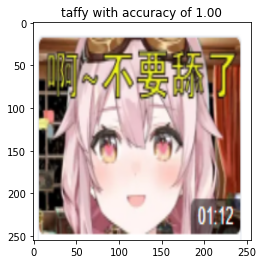

In [198]:
plt.imshow(test_X[2])
pred = model.predict(test_X[2:3])
plt.title('%s with accuracy of %.2f' % (classes[np.argmax(pred[0])], pred[0].max()))

# Attacked pic

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'kaguranana with accuracy of 1.00')

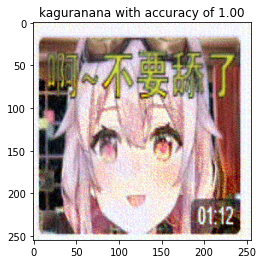

In [199]:
plt.imshow(adverImage[0])
pred = model.predict(adverImage)
plt.title('%s with accuracy of %.2f' % (classes[np.argmax(pred[0])], pred[0].max()))

## 6.1. Target

In [201]:
def generate_adversaries_target(model, baseImage, delta, classIdx, targetIdx, cceLoss, optimizer, steps=50):
    for step in range(steps):
        with tf.GradientTape() as tape:
            tape.watch(delta)
            
            adversary = preprocess_data(baseImage, delta)
            #prediction = model.predict(np.array([adversary]))
            #loss, acc = model.evaluate(np.array([adversary]), np.array([classIdx]))
            predictions = model(adversary, training=False)
            loss = -cceLoss(predictions, tf.convert_to_tensor([classIdx])) +cceLoss(predictions, tf.convert_to_tensor([targetIdx]))
            
        if step % 5 == 0:
            print("step:%d, loss:%.4f" % (step, loss))
                
        gradients = tape.gradient(loss, delta)
            
        optimizer.apply_gradients([(gradients, delta)])
        delta.assign_add(clip_eps(delta, eps=EPS))
            
    return delta

In [242]:
# define
#EPS = 2 / 255.0 / 255.0
EPS = 2 / 255.0 / 255.0
LR = 0.0001

baseImage = test_X[:1]
delta = generate_delta(baseImage)
classIdx = test_y[2]
targetIdx = test_y[5]
optimizer = Adam(learning_rate = LR)
cceLoss = CategoricalCrossentropy()

In [243]:
print("[INFO]generating perturbation...")
delta = generate_adversaries_target(model, baseImage, delta, classIdx, targetIdx, cceLoss, optimizer, steps=500)

[INFO]generating perturbation...
step:0, loss:16.1060
step:5, loss:16.0948
step:10, loss:16.0738
step:15, loss:16.0344
step:20, loss:15.9584
step:25, loss:15.8097
step:30, loss:15.5147
step:35, loss:14.9291
step:40, loss:13.7792
step:45, loss:11.6131
step:50, loss:7.8961
step:55, loss:2.4850
step:60, loss:-3.5682
step:65, loss:-8.5550
step:70, loss:-11.7369
step:75, loss:-13.4950
step:80, loss:-14.4401
step:85, loss:-14.9644
step:90, loss:-15.2745
step:95, loss:-15.4708
step:100, loss:-15.6027
step:105, loss:-15.6962
step:110, loss:-15.7656
step:115, loss:-15.8189
step:120, loss:-15.8608
step:125, loss:-15.8947
step:130, loss:-15.9226
step:135, loss:-15.9461
step:140, loss:-15.9659
step:145, loss:-15.9829
step:150, loss:-15.9975
step:155, loss:-16.0102
step:160, loss:-16.0213
step:165, loss:-16.0310
step:170, loss:-16.0395
step:175, loss:-16.0471
step:180, loss:-16.0537
step:185, loss:-16.0596
step:190, loss:-16.0649
step:195, loss:-16.0695
step:200, loss:-16.0737
step:205, loss:-16.07

In [244]:
adverImage = preprocess_data(baseImage, delta)

# Original pic

Text(0.5, 1.0, 'taffy with accuracy of 1.00')

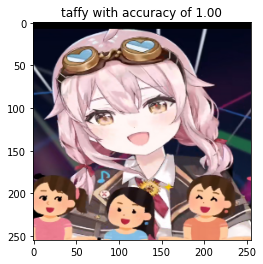

In [245]:
plt.imshow(baseImage[0])
pred = model.predict(baseImage)
plt.title('%s with accuracy of %.2f' % (classes[np.argmax(pred[0])], pred[0].max()))

# Attacked pic

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'dongbro with accuracy of 1.00')

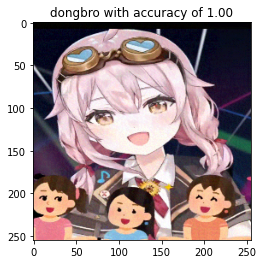

In [246]:
plt.imshow(adverImage[0])
pred = model.predict(adverImage)
plt.title('%s with accuracy of %.2f' % (classes[np.argmax(pred[0])], pred[0].max()))

# Delta pic

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'delta')

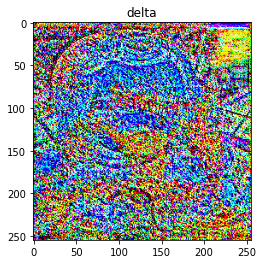

In [249]:
plt.imshow(delta[0] * 50)
plt.title('delta')